In [87]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import StandardScaler

from optbinning import BinningProcess

# set col width
pd.set_option('display.max_colwidth', 100)

# set plot style
sns.set_style('whitegrid')

# set palette
custom_palette = ["#118DF0", "#FF304F"]
sns.set_palette(custom_palette)

In [88]:
def create_features(df):
    # Calculate new features
    new_columns = {
        'DAYS_EMPLOYED_PERC': df['DAYS_EMPLOYED'] / df['DAYS_BIRTH'],
        'INCOME_CREDIT_PERC': df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT'],
        'INCOME_PER_PERSON': df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS'],
        'ANNUITY_INCOME_PERC': df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL'],
        'PAYMENT_RATE': df['AMT_ANNUITY'] / df['AMT_CREDIT'],
        'NEW_PAYMENT_RATE': df['AMT_CREDIT'] / df['AMT_ANNUITY'],
        'CHILDREN_RATIO': df['CNT_CHILDREN'] / df['CNT_FAM_MEMBERS'],
        'CREDIT_TO_ANNUITY_RATIO': df['AMT_CREDIT'] / df['AMT_ANNUITY'],
        'CREDIT_TO_GOODS_RATIO': df['AMT_CREDIT'] / df['AMT_GOODS_PRICE'],
        'CREDIT_GOODS_PRICE_RATIO1': (df['AMT_CREDIT'] - df['AMT_GOODS_PRICE']) /  df['AMT_GOODS_PRICE'],
        'ANNUITY_TO_INCOME_RATIO': df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL'],
        'CREDIT_TO_INCOME_RATIO': df['AMT_CREDIT'] / df['AMT_INCOME_TOTAL'],
        'INCOME_TO_EMPLOYED_RATIO': df['AMT_INCOME_TOTAL'] / df['DAYS_EMPLOYED'],
        'INCOME_TO_BIRTH_RATIO': df['AMT_INCOME_TOTAL'] / df['DAYS_BIRTH'],
        'EMPLOYED_TO_BIRTH_RATIO': df['DAYS_EMPLOYED'] / df['DAYS_BIRTH'],
        'ID_TO_BIRTH_RATIO': df['DAYS_ID_PUBLISH'] / df['DAYS_BIRTH'],
        'CAR_TO_BIRTH_RATIO': df['OWN_CAR_AGE'] / df['DAYS_BIRTH'],
        'CAR_TO_EMPLOYED_RATIO': df['OWN_CAR_AGE'] / df['DAYS_EMPLOYED'],
        'PHONE_TO_BIRTH_RATIO': df['DAYS_LAST_PHONE_CHANGE'] / df['DAYS_BIRTH'],
        'NEW_DAYS_EMPLOYED_PERC': df['DAYS_EMPLOYED'] / df['DAYS_BIRTH'],
        'INCOME_RATIO' : df['AMT_INCOME_TOTAL'] / df.groupby(['ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE'])['AMT_INCOME_TOTAL'].transform('median'),
        # Loan Utilization Ratio
        'LOAN_UR': df['AMT_CREDIT'] / df['AMT_GOODS_PRICE'],
        # Age
        'AGE': df['DAYS_BIRTH'].apply(lambda x: -int(x / 365)),
        # Debt Burden Ratio
        'DEBT_BURDEN': df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL'],
        # External Source
        'EXT_SOURCE_PROD': df['EXT_SOURCE_1'] * df['EXT_SOURCE_2'] * df['EXT_SOURCE_3'],
        'EXT_SOURCE_MEAN': df[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].mean(axis=1),
        'EXT_SOURCE_STD': df[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].std(axis=1),
        'EXT_SOURCE_WEIGHTED': df['EXT_SOURCE_1'] * 2 + df['EXT_SOURCE_2'] * 3 + df['EXT_SOURCE_3'] * 1,
        'EXT_SOURCE_MIN': df[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].min(axis=1),
        'EXT_SOURCE_MAX': df[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].max(axis=1),
    }

    # Add new columns to the DataFrame all at once
    df = pd.concat([df, pd.DataFrame(new_columns)], axis=1)
    df['DEBT_BURDEN_PER_LIFE_DAY'] = df['NEW_PAYMENT_RATE'] / df['DAYS_BIRTH']

    return df

In [89]:
df = pd.read_csv('../raw-data/dseb63_application_train.csv')
df.drop('Unnamed: 0', axis=1, inplace=True)
df.set_index('SK_ID_CURR', inplace=True)
df_copy = df.copy()
df.head()

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
278621,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
139008,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
138348,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
64140,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,454500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
219374,0,Cash loans,M,Y,Y,0,360000.0,1530000.0,42075.0,1530000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [90]:
df = create_features(df)
df.head()

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,LOAN_UR,AGE,DEBT_BURDEN,EXT_SOURCE_PROD,EXT_SOURCE_MEAN,EXT_SOURCE_STD,EXT_SOURCE_WEIGHTED,EXT_SOURCE_MIN,EXT_SOURCE_MAX,DEBT_BURDEN_PER_LIFE_DAY
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
278621,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,...,1.145199,45,0.132217,NaN,0.466757,0.219895,NaN,0.311267,0.622246,-0.002161
139008,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,...,1.052803,52,0.219900,NaN,0.650442,NaN,NaN,0.650442,0.650442,-0.000554
138348,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,...,1.000000,54,0.179963,NaN,0.322738,NaN,NaN,0.322738,0.322738,-0.001177
64140,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,454500.0,...,1.079198,46,0.277955,NaN,0.487726,0.188799,NaN,0.354225,0.621226,-0.001052
219374,0,Cash loans,M,Y,Y,0,360000.0,1530000.0,42075.0,1530000.0,...,1.000000,51,0.116875,NaN,0.627467,0.122771,NaN,0.540654,0.714279,-0.001929


# EDA

## Outliers

In [91]:
num_cols = df.select_dtypes(include=np.number).columns.tolist()
cat_cols = df.select_dtypes(include='object').columns.tolist()

cols_to_plot = df[num_cols].var()[df[num_cols].var() > 0.01].index.tolist()
print(f'Plotting {len(cols_to_plot)} columns: {cols_to_plot}')
ncol, nrow = 3, len(cols_to_plot)//3 + 1

Plotting 84 columns: ['TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'YEARS_BUILD_AVG', 'ELEVATORS_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LIVINGAREA_AVG', 'APARTMENTS_MODE', 'YEARS_BUILD_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'FLOORSMIN_MODE', 'LIVINGAREA_MODE', 'APARTMENTS_MEDI', 'YEARS_BUILD_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMIN_MEDI', 'LIVINGAREA_MEDI', 'TOTALAREA_MODE', 'OBS_30_CNT_SOCIAL_CIRCLE', 'D

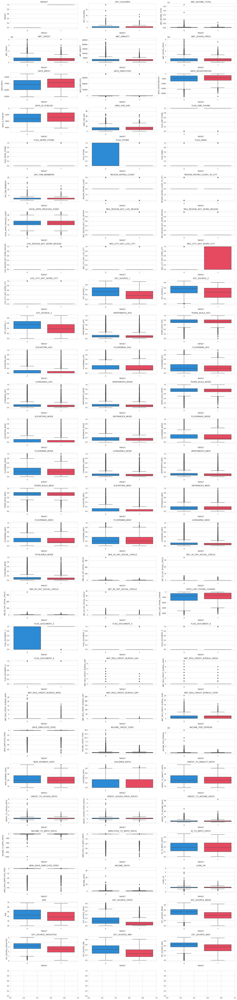

In [92]:
# Boxplot of numerical features with hue = target
fig, ax = plt.subplots(nrow, ncol, figsize=(20, len(cols_to_plot)))

for i, col in enumerate(cols_to_plot):
    sns.boxplot(x='TARGET', y=col, data=df, ax=ax[i//ncol, i%ncol])
    ax[i//ncol, i%ncol].set_title(col)

plt.tight_layout()
plt.show()

In [93]:
# # Process outliers by clipping
# for col in num_cols:
#     df[col] = df[col].clip(lower=df[col].quantile(0.01), upper=df[col].quantile(0.99))

## Descriptive

In [94]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 246009 entries, 278621 to 258328
Columns: 152 entries, TARGET to DEBT_BURDEN_PER_LIFE_DAY
dtypes: float64(95), int64(41), object(16)
memory usage: 287.2+ MB


In [95]:
# Describe the numerical features
df[num_cols].describe()

,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,LOAN_UR,AGE,DEBT_BURDEN,EXT_SOURCE_PROD,EXT_SOURCE_MEAN,EXT_SOURCE_STD,EXT_SOURCE_WEIGHTED,EXT_SOURCE_MIN,EXT_SOURCE_MAX,DEBT_BURDEN_PER_LIFE_DAY
count,246009.000000,246009.000000,2.460090e+05,2.460090e+05,245999.000000,2.457850e+05,246009.000000,246009.000000,246009.000000,246009.000000,...,245785.000000,246009.000000,245999.000000,8.783500e+04,245875.000000,2.164390e+05,87835.000000,2.458750e+05,245875.000000,245999.000000
mean,0.080794,0.416229,1.684589e+05,5.996410e+05,27120.238129,5.389827e+05,0.020855,-16038.946343,63852.612441,-4985.222248,...,1.122911,43.440939,0.180915,1.436936e-01,0.509317,1.511164e-01,3.102404,3.997442e-01,0.615847,-0.001440
std,0.272519,0.720664,1.045297e+05,4.030980e+05,14510.634712,3.700520e+05,0.013818,4361.265483,141306.376949,3521.391396,...,0.123754,11.947430,0.094651,1.078862e-01,0.149795,9.982804e-02,0.814490,1.872999e-01,0.156167,0.000634
min,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,-23416.000000,...,0.150000,20.000000,0.003333,2.430332e-07,0.000011,3.538459e-07,0.125140,8.173617e-08,0.000011,-0.005143
25%,0.000000,0.000000,1.125000e+05,2.700000e+05,16506.000000,2.385000e+05,0.010006,-19682.000000,-2758.000000,-7482.000000,...,1.000000,34.000000,0.114739,5.618227e-02,0.413514,7.227397e-02,2.577503,2.539628e-01,0.540654,-0.001793
50%,0.000000,0.000000,1.462500e+05,5.147775e+05,24903.000000,4.500000e+05,0.018850,-15755.000000,-1212.000000,-4504.000000,...,1.118800,43.000000,0.162780,1.203405e-01,0.524666,1.358669e-01,3.181555,4.033329e-01,0.648341,-0.001349
75%,0.000000,1.000000,2.025000e+05,8.086500e+05,34654.500000,6.795000e+05,0.028663,-12418.000000,-288.000000,-2006.000000,...,1.198000,53.000000,0.228867,2.108250e-01,0.622943,2.142668e-01,3.709881,5.530672e-01,0.725276,-0.000980
max,1.000000,19.000000,1.350000e+07,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,0.000000,...,6.000000,69.000000,1.875965,6.185571e-01,0.878903,6.519439e-01,5.042233,8.789034e-01,0.951624,-0.000337


In [96]:
# Replace 365243 with NaN
df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace=True)

# Replace DAYS columns value > 50 years with NaN
days_cols = [col for col in df.columns if 'DAYS' in col]
for col in days_cols:
    mask = df[col] < -50*365
    df.loc[mask, col] = np.nan
    
# Process outliers by clipping
for col in num_cols:
    df[col] = df[col].clip(lower=df[col].quantile(0.01), upper=df[col].quantile(0.99))

df.describe()

,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,LOAN_UR,AGE,DEBT_BURDEN,EXT_SOURCE_PROD,EXT_SOURCE_MEAN,EXT_SOURCE_STD,EXT_SOURCE_WEIGHTED,EXT_SOURCE_MIN,EXT_SOURCE_MAX,DEBT_BURDEN_PER_LIFE_DAY
count,246009.000000,246009.000000,246009.000000,2.460090e+05,245999.000000,2.457850e+05,246009.000000,163032.000000,201685.000000,245945.000000,...,245785.000000,246009.000000,245999.000000,87835.000000,245875.000000,216439.000000,87835.000000,245875.000000,245875.000000,245999.000000
mean,0.080794,0.413643,166128.016966,5.969180e+05,26956.017059,5.373208e+05,0.020859,-13458.539397,-2368.846756,-4970.922127,...,1.122620,43.432671,0.179964,0.143347,0.509591,0.150732,3.103676,0.399684,0.616201,-0.001436
std,0.272519,0.705684,83060.345130,3.919497e+05,13672.618920,3.624009e+05,0.013812,2714.100706,2273.672280,3483.299015,...,0.119811,11.915623,0.089782,0.106785,0.148155,0.098533,0.805749,0.186642,0.153821,0.000620
min,0.000000,0.000000,45000.000000,7.641000e+04,6187.500000,6.750000e+04,0.002134,-18142.000000,-11349.000000,-13814.560000,...,1.000000,22.000000,0.039474,0.001422,0.110399,0.003679,1.009627,0.020155,0.132275,-0.003382
25%,0.000000,0.000000,112500.000000,2.700000e+05,16506.000000,2.385000e+05,0.010006,-15711.000000,-3174.000000,-7479.000000,...,1.000000,34.000000,0.114739,0.056182,0.413514,0.072274,2.577503,0.253963,0.540654,-0.001793
50%,0.000000,0.000000,146250.000000,5.147775e+05,24903.000000,4.500000e+05,0.018850,-13553.000000,-1646.000000,-4503.000000,...,1.118800,43.000000,0.162780,0.120340,0.524666,0.135867,3.181555,0.403333,0.648341,-0.001349
75%,0.000000,1.000000,202500.000000,8.086500e+05,34654.500000,6.795000e+05,0.028663,-11238.000000,-766.000000,-2006.000000,...,1.198000,53.000000,0.228867,0.210825,0.622943,0.214267,3.709881,0.553067,0.725276,-0.000980
max,1.000000,3.000000,472500.000000,1.852801e+06,70015.500000,1.800000e+06,0.072508,-8141.000000,-111.000000,-49.000000,...,1.475200,66.000000,0.483946,0.441822,0.772694,0.428616,4.585659,0.749515,0.868230,-0.000418


In [97]:
# Cols with variance 0
df[num_cols].var()[df[num_cols].var() <= 1e-3]

REGION_POPULATION_RELATIVE      1.907838e-04
FLAG_MOBIL                      0.000000e+00
FLAG_CONT_MOBILE                0.000000e+00
YEARS_BEGINEXPLUATATION_AVG     7.326714e-05
NONLIVINGAPARTMENTS_AVG         2.313320e-04
YEARS_BEGINEXPLUATATION_MODE    7.434413e-05
NONLIVINGAPARTMENTS_MODE        1.934830e-04
YEARS_BEGINEXPLUATATION_MEDI    7.307543e-05
NONLIVINGAPARTMENTS_MEDI        2.203071e-04
FLAG_DOCUMENT_2                 0.000000e+00
FLAG_DOCUMENT_4                 0.000000e+00
FLAG_DOCUMENT_7                 0.000000e+00
FLAG_DOCUMENT_9                 0.000000e+00
FLAG_DOCUMENT_10                0.000000e+00
FLAG_DOCUMENT_11                0.000000e+00
FLAG_DOCUMENT_12                0.000000e+00
FLAG_DOCUMENT_13                0.000000e+00
FLAG_DOCUMENT_14                0.000000e+00
FLAG_DOCUMENT_15                0.000000e+00
FLAG_DOCUMENT_16                0.000000e+00
FLAG_DOCUMENT_17                0.000000e+00
FLAG_DOCUMENT_18                0.000000e+00
FLAG_DOCUM

In [98]:
# Describe the categorical features
cat_desc = df[cat_cols].describe()
cat_desc.loc['freq_perc'] = cat_desc.loc['freq'] / len(df)
cat_desc

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
count,246009,246009,246009,246009,244963,246009,246009,246009,246009,168903,246009,246009,77722,122469,120829,129317
unique,2,3,2,2,7,8,5,6,6,18,7,58,4,3,7,2
top,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
freq,222491,161856,162184,170843,198742,126930,174522,157320,218389,44202,43128,54312,58964,120320,52873,127434
freq_perc,0.904402,0.657927,0.65926,0.694458,0.807865,0.515957,0.709413,0.639489,0.887728,0.179676,0.175311,0.220772,0.239682,0.489088,0.214923,0.518005


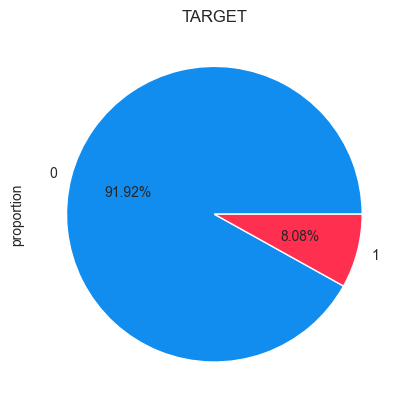

In [99]:
# Describe the target variable and plot
plt.figsize=(10, 8)
df['TARGET'].value_counts(normalize=True).plot(kind='pie', autopct='%.2f%%')
plt.title('TARGET')
plt.show()

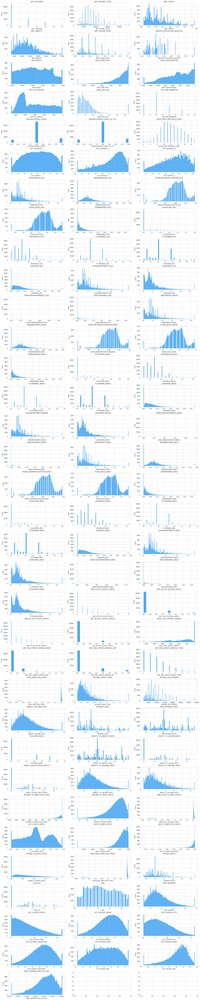

In [100]:
# Plot the histogram of numerical features with nuniques > 2
cols_to_plot = df[num_cols].nunique()[df[num_cols].nunique() > 2].index.tolist()
ncol, nrow = 3, len(cols_to_plot)//3 + 1

fig , axes = plt.subplots(nrows=nrow, ncols=ncol, figsize=(20, len(cols_to_plot)), constrained_layout=True)

for ax, column in zip(axes.flatten(), cols_to_plot): 
    sns.histplot(df[column], ax=ax)
    ax.set_title(column)

plt.show()

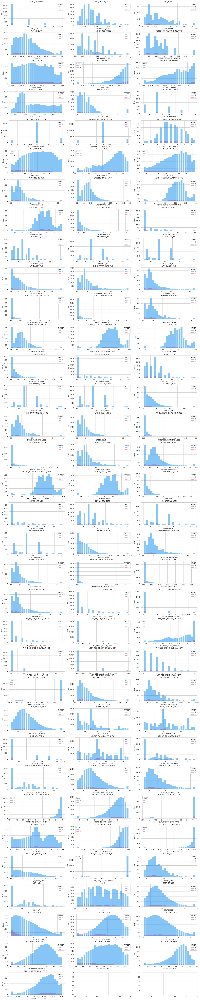

In [101]:
# Plot the histogram of numerical features with nuniques > 2 hue = target
cols_to_plot = df[num_cols].nunique()[df[num_cols].nunique() > 2].index.tolist()
ncol, nrow = 3, len(cols_to_plot)//3 + 1

fig , axes = plt.subplots(nrows=nrow, ncols=ncol, figsize=(20, len(cols_to_plot)), constrained_layout=True)

for ax, column in zip(axes.flatten(), cols_to_plot): 
    # histplot with hue
    sns.histplot(df, x=column, hue='TARGET', ax=ax, bins=25)
    ax.set_title(column)

plt.show()

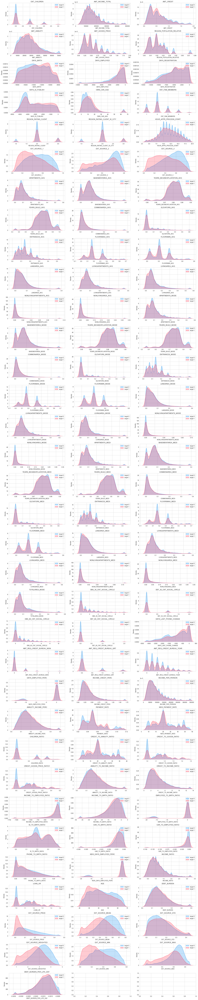

In [102]:
# Plot the distribution of the numerical features with hue = target
fig, ax = plt.subplots(nrow, ncol, figsize=(20, len(cols_to_plot)))

for i, col in enumerate(cols_to_plot):
    # kde plot
    sns.kdeplot(df.loc[df['TARGET'] == 0, col], label='target 0', ax=ax[i//ncol, i%ncol], fill=True)
    sns.kdeplot(df.loc[df['TARGET'] == 1, col], label='target 1', ax=ax[i//ncol, i%ncol], fill=True)
    ax[i//ncol, i%ncol].set_title(col)
    ax[i//ncol, i%ncol].legend()

plt.tight_layout()
plt.show()

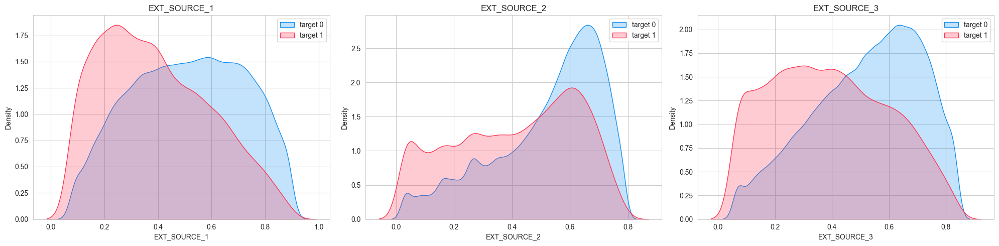

In [103]:
# Distribution of EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3
fig, ax = plt.subplots(1, 3, figsize=(20, 5))

for i, col in enumerate(['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']):
    sns.kdeplot(df.loc[df['TARGET'] == 0, col], label='target 0', ax=ax[i], fill=True)
    sns.kdeplot(df.loc[df['TARGET'] == 1, col], label='target 1', ax=ax[i], fill=True)
    ax[i].set_title(col)
    ax[i].legend()

plt.tight_layout()
plt.show()

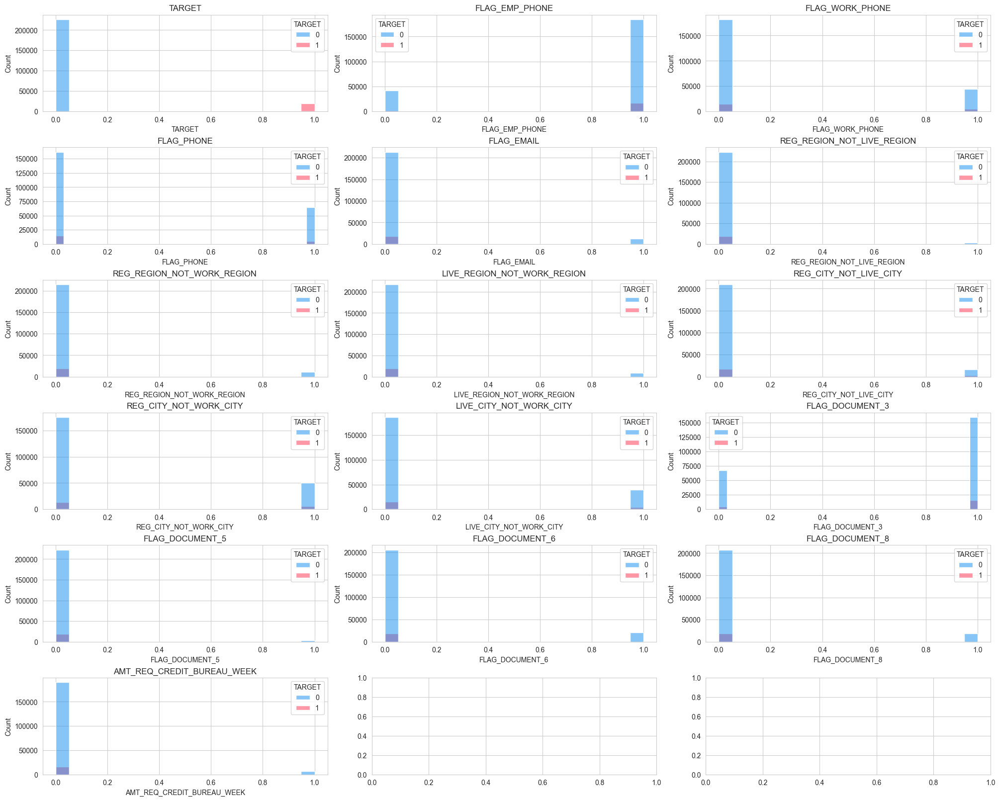

In [104]:
# Plot distribution of binary features with hue = target
cols_to_plot = df[num_cols].nunique()[df[num_cols].nunique() == 2].index.tolist()
ncol, nrow = 3, len(cols_to_plot)//3 + 1

fig , axes = plt.subplots(nrows=nrow, ncols=ncol, figsize=(20, len(cols_to_plot)), constrained_layout=True)

for ax, column in zip(axes.flatten(), cols_to_plot):
    sns.histplot(df, x=column, hue='TARGET', ax=ax)
    ax.set_title(column)

plt.show()

Plotting 40 columns: ['CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_PHONE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_3', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'DAYS_EMPLOYED_PERC', 'INCOME_PER_PERSON', 'NEW_PAYMENT_RATE', 'CREDIT_TO_ANNUITY_RATIO', 'CREDIT_TO_INCOME_RATIO', 'INCOME_TO_EMPLOYED_RATIO', 'INCOME_TO_BIRTH_RATIO', 'EMPLOYED_TO_BIRTH_RATIO', 'NEW_DAYS_EMPLOYED_PERC', 'INCOME_RATIO', 'AGE', 'EXT_SOURCE_WEIGHTED']


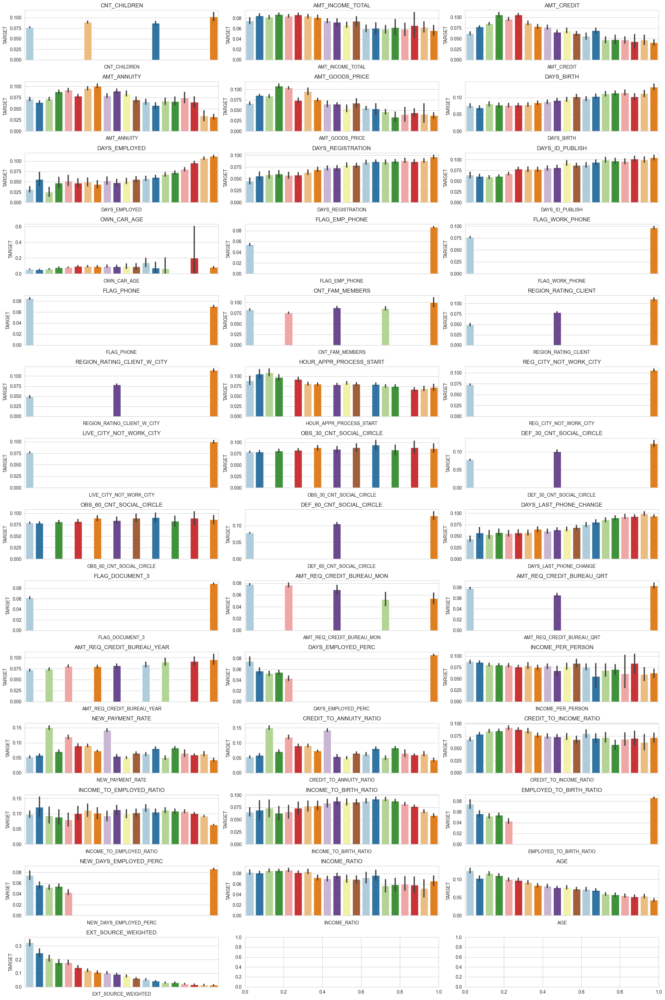

In [105]:
# Plot the distribution of the binned numerical features with hue = target
cols_to_plot = df[num_cols].var()[df[num_cols].var() > 0.1].index.tolist()
print(f'Plotting {len(cols_to_plot)} columns: {cols_to_plot}')
ncol, nrow = 3, len(cols_to_plot)//3 + 1
fig, ax = plt.subplots(nrow, ncol, figsize=(20, 30))

for i, col in enumerate(cols_to_plot):
    val = pd.cut(df[col], bins=20)
    sns.barplot(x=val, y=df['TARGET'], ax=ax[i//ncol, i%ncol], palette='Paired')
    ax[i//ncol, i%ncol].set_title(col)
    # ax[i//ncol, i%ncol].tick_params(axis='x', rotation=45)
    # remove xticks
    ax[i//ncol, i%ncol].set_xticklabels([])

plt.tight_layout()
plt.show()

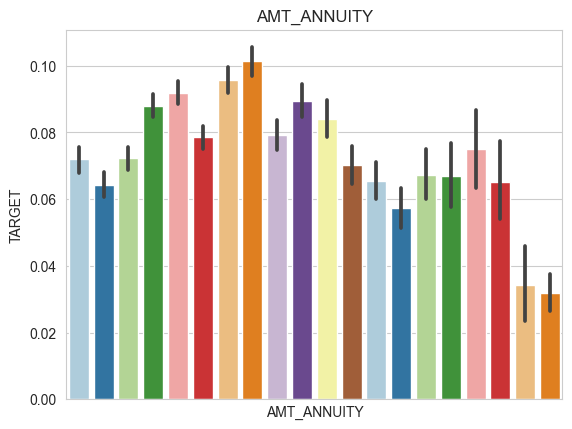

In [106]:
# Plot AMT_ANNUITY cut
val = pd.cut(df['AMT_ANNUITY'], bins=20)
sns.barplot(x=val, y=df['TARGET'], palette='Paired')
# remove xticks
plt.xticks([])
plt.title('AMT_ANNUITY')
plt.show()

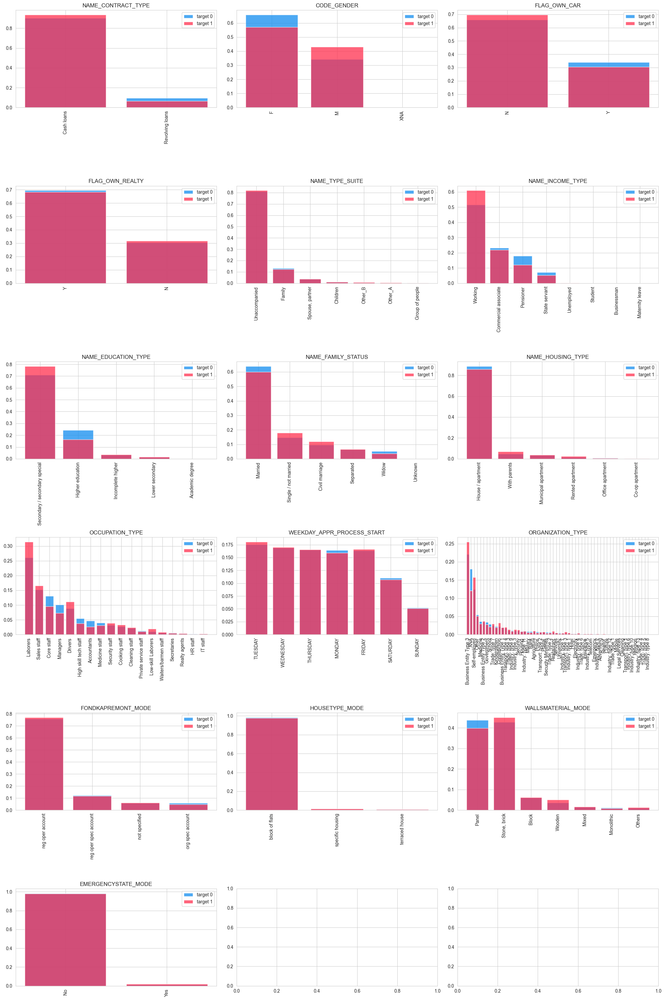

In [107]:
# Plot the distribution of the categorical features with hue = target
cols_to_plot = cat_cols
ncol, nrow = 3, len(cols_to_plot)//3 + 1
fig, ax = plt.subplots(nrow, ncol, figsize=(20, 30))

for i, col in enumerate(cols_to_plot):
    # normalized count plot
    ax[i//ncol, i%ncol].bar(df[col].value_counts(normalize=True).index, df[col].value_counts(normalize=True), label='target 0', alpha=0.75)
    ax[i//ncol, i%ncol].bar(df.loc[df['TARGET'] == 1, col].value_counts(normalize=True).index, df.loc[df['TARGET'] == 1, col].value_counts(normalize=True), label='target 1', alpha=0.75)
    ax[i//ncol, i%ncol].set_xticks(df[col].value_counts(normalize=True).index)
    ax[i//ncol, i%ncol].set_xticklabels(df[col].value_counts(normalize=True).index, rotation=90)
    ax[i//ncol, i%ncol].set_title(col)
    ax[i//ncol, i%ncol].legend()

plt.tight_layout()
plt.show()

## Missing Values

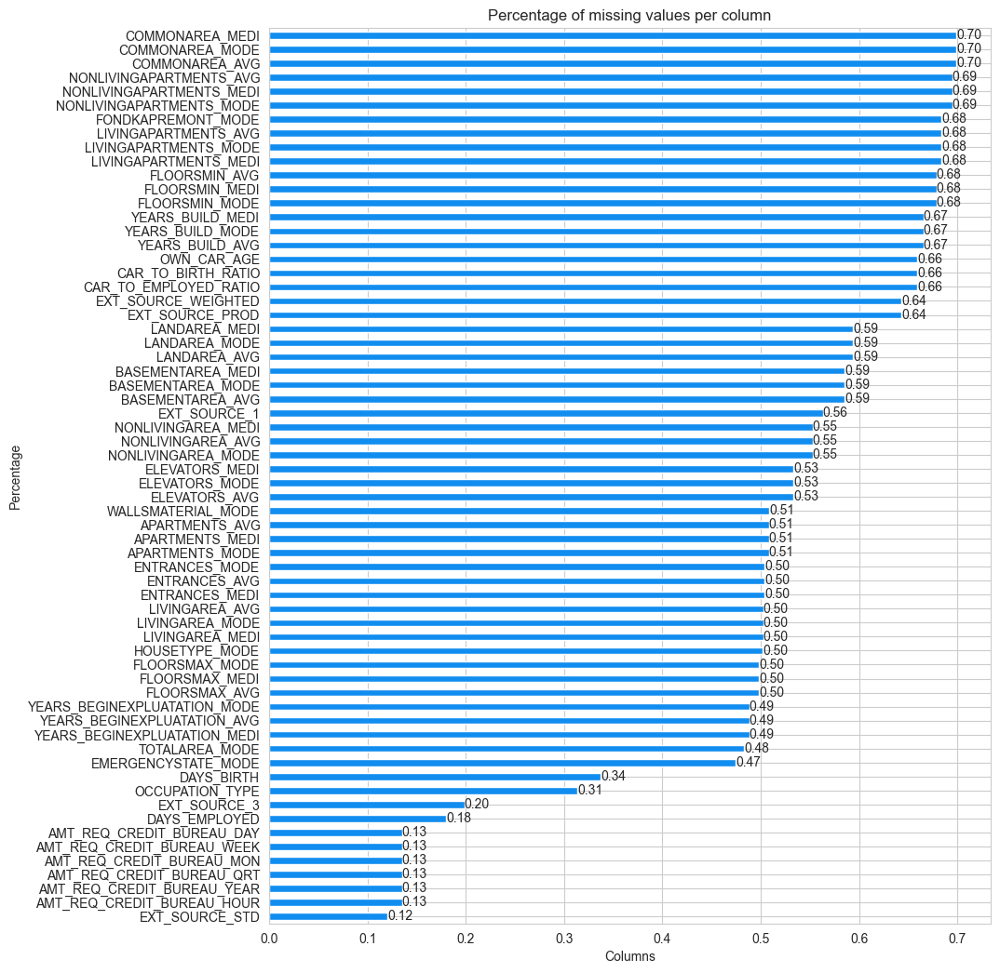

In [108]:
# Bar plot number of missing values column >10% ascending 
cols_with_null = df.isnull().mean() > 0.1
cols_with_null = cols_with_null[cols_with_null == True]
cols_with_null = cols_with_null.index
df[cols_with_null].isnull().mean().sort_values(ascending=True).plot(kind='barh', figsize=(10, 12.5))
# annotate bar plot
for i, v in enumerate(df[cols_with_null].isnull().mean().sort_values(ascending=True)):
    plt.text(v, i, '{:.2f}'.format(v), ha='left', va='center')
plt.title('Percentage of missing values per column')
plt.ylabel('Percentage')
plt.xlabel('Columns')
plt.show()

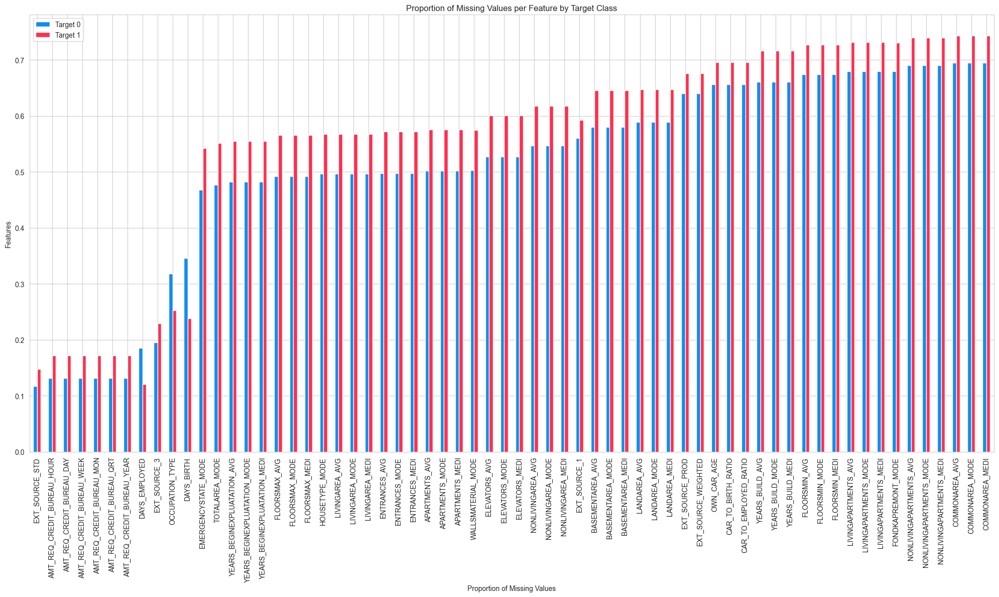

In [109]:
# Plot proportion of missing values each column hue = target
cols_to_plot = cols_with_null
data = []

for col in cols_to_plot:
    null_class_0 = df.loc[df['TARGET'] == 0, col].isnull().mean()
    null_class_1 = df.loc[df['TARGET'] == 1, col].isnull().mean()
    data.append({'Feature': col, 'Target 0': null_class_0, 'Target 1': null_class_1})

missing_df = pd.DataFrame(data)

# Plotting
fig, ax = plt.subplots(figsize=(20, 12))

# Stacked bar chart
missing_df.sort_values(by=['Target 0', 'Target 1'], ascending=True, inplace=True)
missing_df.set_index('Feature').plot(kind='bar', stacked=False, ax=ax)

ax.set_xlabel('Proportion of Missing Values')
ax.set_ylabel('Features')
ax.set_title('Proportion of Missing Values per Feature by Target Class')

plt.tight_layout()
plt.show()

## Correlation

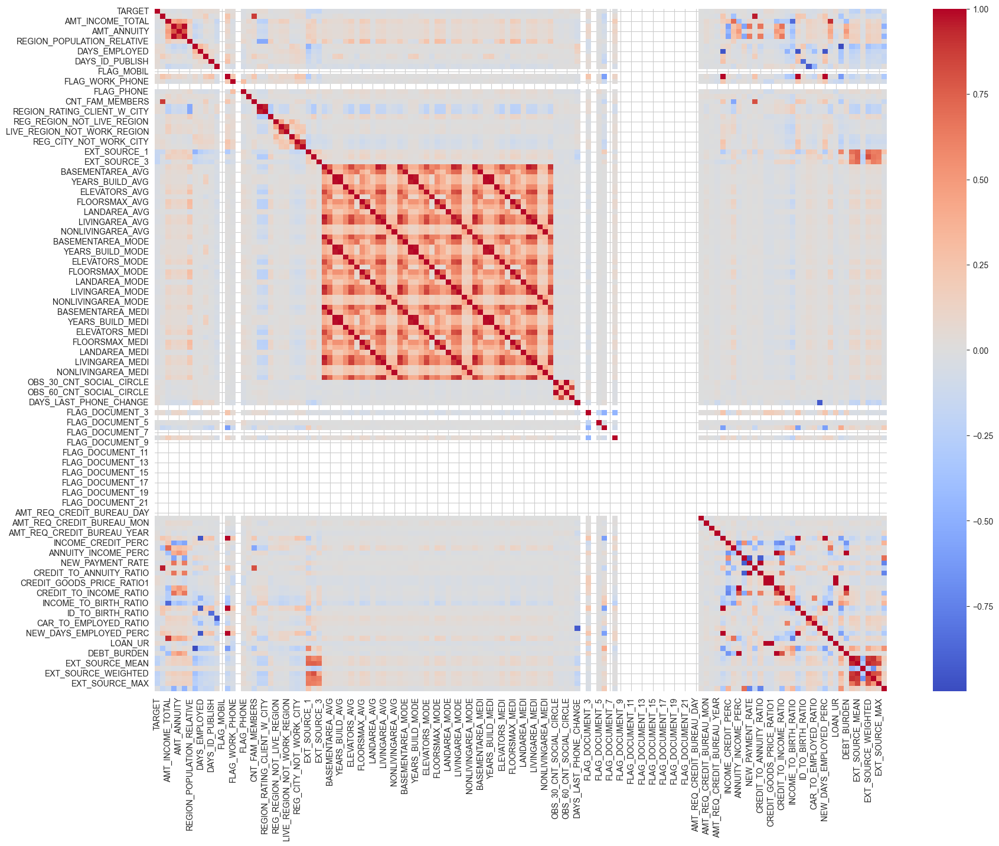

In [110]:
# Plot correlation matrix
corr = df[num_cols].corr()
plt.figure(figsize=(20, 15))
sns.heatmap(corr, cmap='coolwarm')
plt.show()

In [111]:
# Filter out highly correlated features
high_corr_cols = []
for i in range(len(corr)):
    for j in range(i+1, len(corr)):
        if 1 > abs(corr.iloc[i, j]) > 0.9:
            high_corr_cols.append(corr.columns[j])
            print(f'{corr.columns[i]}, {corr.columns[j]}: {corr.iloc[i, j]}')

CNT_CHILDREN, CHILDREN_RATIO: 0.9597413626876813
AMT_INCOME_TOTAL, INCOME_RATIO: 0.9192217152844684
AMT_CREDIT, AMT_GOODS_PRICE: 0.9864087940029821
DAYS_BIRTH, AGE: -0.9992702272455642
DAYS_EMPLOYED, DAYS_EMPLOYED_PERC: -0.9561247406172007
DAYS_EMPLOYED, EMPLOYED_TO_BIRTH_RATIO: -0.9561247406172007
DAYS_EMPLOYED, NEW_DAYS_EMPLOYED_PERC: -0.9561247406172007
OWN_CAR_AGE, CAR_TO_BIRTH_RATIO: -0.9442454281443532
FLAG_EMP_PHONE, DAYS_EMPLOYED_PERC: 0.9963612743101903
FLAG_EMP_PHONE, EMPLOYED_TO_BIRTH_RATIO: 0.9963612743101903
FLAG_EMP_PHONE, NEW_DAYS_EMPLOYED_PERC: 0.9963612743101903
REGION_RATING_CLIENT, REGION_RATING_CLIENT_W_CITY: 0.9509880039018394
APARTMENTS_AVG, LIVINGAPARTMENTS_AVG: 0.9652110140044691
APARTMENTS_AVG, LIVINGAREA_AVG: 0.921730716109641
APARTMENTS_AVG, APARTMENTS_MODE: 0.9718797762659463
APARTMENTS_AVG, LIVINGAPARTMENTS_MODE: 0.9433272695958759
APARTMENTS_AVG, APARTMENTS_MEDI: 0.9956509539146213
APARTMENTS_AVG, LIVINGAPARTMENTS_MEDI: 0.9620269902806999
APARTMENTS_AVG, L

In [112]:
len(high_corr_cols)

94

# Feature Importance

In [113]:
# Plot feature importance by IV and WoE
optb = BinningProcess(variable_names=df.columns.to_list())
optb.fit(df, df['TARGET'])
optb.summary()

,name,dtype,status,selected,n_bins,iv,js,gini,quality_score
0,TARGET,numerical,OPTIMAL,True,1,0.0,0.0,0,0.0
1,NAME_CONTRACT_TYPE,categorical,OPTIMAL,True,2,0.0159,0.001974,0.034215,0.01526
2,CODE_GENDER,categorical,OPTIMAL,True,2,0.038714,0.00483,0.095413,0.096336
3,FLAG_OWN_CAR,categorical,OPTIMAL,True,2,0.007429,0.000928,0.040314,0.018538
4,FLAG_OWN_REALTY,categorical,OPTIMAL,True,2,0.000647,0.000081,0.011771,0.001525
...,...,...,...,...,...,...,...,...,...
147,EXT_SOURCE_STD,numerical,OPTIMAL,True,8,0.038438,0.004793,0.10871,0.033679
148,EXT_SOURCE_WEIGHTED,numerical,OPTIMAL,True,6,0.224894,0.026438,0.197131,0.514916
149,EXT_SOURCE_MIN,numerical,OPTIMAL,True,14,0.472883,0.056727,0.378938,0.488565
150,EXT_SOURCE_MAX,numerical,OPTIMAL,True,14,0.446345,0.053571,0.367973,0.504833


In [114]:
summary = optb.summary().set_index('name')
summary.sort_values(by='iv', ascending=False, inplace=True)
summary.head(20)

,dtype,status,selected,n_bins,iv,js,gini,quality_score
name,,,,,,,,
EXT_SOURCE_MEAN,numerical,OPTIMAL,True,14,0.621276,0.073535,0.429858,0.544306
EXT_SOURCE_MIN,numerical,OPTIMAL,True,14,0.472883,0.056727,0.378938,0.488565
EXT_SOURCE_MAX,numerical,OPTIMAL,True,14,0.446345,0.053571,0.367973,0.504833
EXT_SOURCE_3,numerical,OPTIMAL,True,12,0.340914,0.041182,0.318083,0.698405
EXT_SOURCE_2,numerical,OPTIMAL,True,14,0.315041,0.038044,0.307826,0.163551
EXT_SOURCE_PROD,numerical,OPTIMAL,True,6,0.263991,0.030993,0.217216,0.568564
EXT_SOURCE_WEIGHTED,numerical,OPTIMAL,True,6,0.224894,0.026438,0.197131,0.514916
EXT_SOURCE_1,numerical,OPTIMAL,True,5,0.145015,0.017618,0.176302,0.424698
PAYMENT_RATE,numerical,OPTIMAL,True,6,0.115549,0.014271,0.181924,0.38593


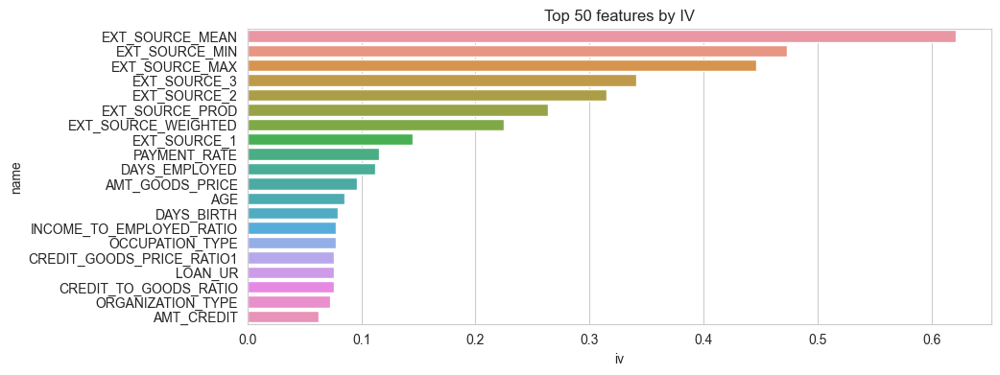

In [115]:
top50 = summary.head(20)

# Plot feature importance by IV and WoE
plt.figure(figsize=(10, len(top50)//5))
sns.barplot(x='iv', y=top50.index, data=top50)
plt.title('Top 50 features by IV')
plt.show()

In [116]:
df = df_copy.copy()

In [117]:
# Prepare data for modelling
# Union cols with null and highly correlated cols
var_0_cols = df.select_dtypes('number').var()[df.select_dtypes('number').var() < 1e-3].index.tolist()
cols_with_null = df[df.columns[df.isnull().mean() > 0.6]].columns.tolist()
cols_to_drop = var_0_cols + high_corr_cols + cols_with_null
cols_to_drop = set(cols_to_drop)
len(cols_to_drop)

66

In [118]:
# Drop cols
df.drop(cols_to_drop, axis=1, inplace=True)
df.shape

KeyError: "['CHILDREN_RATIO', 'AGE', 'EXT_SOURCE_MEAN', 'NEW_PAYMENT_RATE', 'NEW_DAYS_EMPLOYED_PERC', 'PHONE_TO_BIRTH_RATIO', 'CREDIT_TO_ANNUITY_RATIO', 'CREDIT_GOODS_PRICE_RATIO1', 'EXT_SOURCE_MIN', 'LOAN_UR', 'INCOME_RATIO', 'EXT_SOURCE_WEIGHTED', 'DAYS_EMPLOYED_PERC', 'EMPLOYED_TO_BIRTH_RATIO', 'CAR_TO_BIRTH_RATIO'] not found in axis"

In [ ]:
df

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_TYPE_SUITE,...,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_18,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
278621,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,Family,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
139008,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,Unaccompanied,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
138348,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,Unaccompanied,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
64140,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,"Spouse, partner",...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
219374,0,Cash loans,M,Y,Y,0,360000.0,1530000.0,42075.0,Unaccompanied,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90253,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,Unaccompanied,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
9027,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,Unaccompanied,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
163598,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,Unaccompanied,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0


In [ ]:
# Preprocess 
cat_cols = df.select_dtypes(include='object').columns.tolist()
num_cols = df.select_dtypes(include=np.number).columns.tolist()

# Fill missing values
df[num_cols] = df[num_cols].fillna(df[num_cols].median())
df[cat_cols] = df[cat_cols].fillna('Missing')

# One hot encode categorical features
df = pd.get_dummies(df, columns=cat_cols, drop_first=True)

In [ ]:
# Split data into train and test
X = df.drop('TARGET', axis=1)
y = df['TARGET']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Scale numerical features
scaler = StandardScaler().set_output(transform='pandas')
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train logistic regression model
model = LogisticRegression(solver='newton-cholesky', max_iter=200)
model.fit(X_train, y_train)

# Predict
y_pred = model.predict_proba(X_test)[:, 1]

# Evaluate
print(f'ROC AUC score: {roc_auc_score(y_test, y_pred)}')
print(f'GINI score: {2*roc_auc_score(y_test, y_pred) - 1}')

ROC AUC score: 0.7437863072574287
GINI score: 0.48757261451485734


In [ ]:
# Plot by coefficient
coef = pd.DataFrame({'Feature': X.columns, 'Coefficient': abs(model.coef_[0])})
coef.sort_values(by='Coefficient', ascending=False, inplace=True)
coef.head(30)

,Feature,Coefficient
5,DAYS_EMPLOYED,5.429532
8,FLAG_EMP_PHONE,1.663897
68,NAME_INCOME_TYPE_Pensioner,1.654094
167,ORGANIZATION_TYPE_XNA,1.650139
72,NAME_INCOME_TYPE_Working,0.708395
66,NAME_INCOME_TYPE_Commercial associate,0.568628
76,NAME_EDUCATION_TYPE_Secondary / secondary special,0.550158
24,EXT_SOURCE_3,0.479182
73,NAME_EDUCATION_TYPE_Higher education,0.393487
23,EXT_SOURCE_2,0.384657


# Feature Engineering

In [ ]:
df = df_copy.copy()
target = df['TARGET']
df.head()

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
278621,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
139008,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
138348,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
64140,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,454500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
219374,0,Cash loans,M,Y,Y,0,360000.0,1530000.0,42075.0,1530000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
num_cols = df.select_dtypes(include=np.number).columns.tolist()
num_cols.remove('TARGET')

cat_cols = df.select_dtypes(include='object').columns.tolist()

In [ ]:
# Replace XNA with np.nan
df.replace(['XNA', 'Unkown', 'not specified'], np.nan, inplace=True)
df

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
278621,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
139008,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
138348,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
64140,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,454500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
219374,0,Cash loans,M,Y,Y,0,360000.0,1530000.0,42075.0,1530000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90253,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,225000.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
9027,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,225000.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
163598,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,585000.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0


In [ ]:
# Drop cols with variance 0
var_0_cols = df.select_dtypes('number').var()[df.select_dtypes('number').var() < 1e-3].index.tolist()
df.drop(var_0_cols, axis=1, inplace=True, errors='ignore')

# Drop cols with > 60% missing values
cols_with_null = df[df.columns[df.isnull().mean() > 0.6]].columns.tolist()
df.drop(cols_with_null, axis=1, inplace=True)

# Drop highly correlated cols
df.drop(high_corr_cols, axis=1, inplace=True, errors='ignore')

# Print shape
df.shape

(246009, 70)

In [ ]:
optb = BinningProcess(variable_names=df.columns.to_list())
optb.fit(df, df['TARGET'])
optb.summary()

,name,dtype,status,selected,n_bins,iv,js,gini,quality_score
0,TARGET,numerical,OPTIMAL,True,1,0.0,0.0,0,0.0
1,NAME_CONTRACT_TYPE,categorical,OPTIMAL,True,2,0.0159,0.001974,0.034215,0.01526
2,CODE_GENDER,categorical,OPTIMAL,True,2,0.03871,0.004829,0.09542,0.09633
3,FLAG_OWN_CAR,categorical,OPTIMAL,True,2,0.007429,0.000928,0.040314,0.018538
4,FLAG_OWN_REALTY,categorical,OPTIMAL,True,2,0.000647,0.000081,0.011771,0.001525
...,...,...,...,...,...,...,...,...,...
65,AMT_REQ_CREDIT_BUREAU_DAY,numerical,OPTIMAL,True,1,0.012852,0.001602,0.040599,0.018748
66,AMT_REQ_CREDIT_BUREAU_WEEK,numerical,OPTIMAL,True,1,0.012852,0.001602,0.040599,0.018748
67,AMT_REQ_CREDIT_BUREAU_MON,numerical,OPTIMAL,True,2,0.013412,0.001672,0.047378,0.032648
68,AMT_REQ_CREDIT_BUREAU_QRT,numerical,OPTIMAL,True,3,0.0164,0.002045,0.057595,0.04068


In [ ]:
summary = optb.summary().set_index('name')
summary.sort_values(by='gini', ascending=False, inplace=True)
summary.head(20)

,dtype,status,selected,n_bins,iv,js,gini,quality_score
name,,,,,,,,
EXT_SOURCE_3,numerical,OPTIMAL,True,12,0.340914,0.041182,0.318083,0.698405
EXT_SOURCE_2,numerical,OPTIMAL,True,14,0.315041,0.038044,0.307826,0.163551
DAYS_EMPLOYED,numerical,OPTIMAL,True,12,0.112837,0.013995,0.187207,0.193191
EXT_SOURCE_1,numerical,OPTIMAL,True,5,0.145015,0.017618,0.176302,0.424698
DAYS_BIRTH,numerical,OPTIMAL,True,14,0.086207,0.010688,0.165341,0.021156
OCCUPATION_TYPE,categorical,OPTIMAL,True,6,0.077268,0.009619,0.148418,0.173918
ORGANIZATION_TYPE,categorical,OPTIMAL,True,8,0.072775,0.009045,0.148025,0.124951
AMT_CREDIT,numerical,OPTIMAL,True,10,0.062098,0.007698,0.13438,0.217831
NAME_INCOME_TYPE,categorical,OPTIMAL,True,4,0.055244,0.006871,0.119035,0.168986


In [ ]:
# Transform data
df = optb.transform(df)
df

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_TYPE_SUITE,...,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_18,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,0.0,-0.037245,0.154692,-0.059639,-0.037917,0.050879,0.150458,0.323387,-0.084735,0.057823,...,0.0,0.0,0.0,0.0,0.047887,0.047887,0.047887,0.036651,0.029509,0.127375
1,0.0,-0.037245,0.154692,-0.059639,0.017071,0.050879,-0.063269,-0.183036,-0.176945,-0.014074,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.0,-0.037245,-0.251043,-0.059639,0.017071,0.050879,-0.063269,-0.225226,-0.085663,-0.014074,...,0.0,0.0,0.0,0.0,0.047887,0.047887,0.047887,0.036651,0.029509,0.127375
3,0.0,-0.037245,-0.251043,-0.059639,0.017071,0.050879,-0.063269,-0.225226,-0.176945,0.057823,...,0.0,0.0,0.0,0.0,0.047887,0.047887,0.047887,0.036651,0.219124,0.097769
4,0.0,-0.037245,-0.251043,0.124648,0.017071,0.050879,0.329659,0.669831,0.153063,-0.014074,...,0.0,0.0,0.0,0.0,0.047887,0.047887,0.047887,0.036651,0.029509,0.127375
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
246004,0.0,-0.037245,-0.251043,-0.059639,-0.037917,0.050879,-0.099075,0.055007,-0.176945,-0.014074,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
246005,0.0,-0.037245,0.154692,-0.059639,0.017071,0.050879,0.036387,0.055007,0.197173,-0.014074,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
246006,0.0,-0.037245,0.154692,-0.059639,0.017071,0.050879,-0.099075,0.051465,-0.376979,-0.014074,...,0.0,0.0,0.0,0.0,0.047887,0.047887,0.047887,0.106665,0.029509,0.097769
246007,0.0,-0.037245,0.154692,-0.059639,0.017071,0.050879,-0.049479,-0.247173,-0.085663,-0.014074,...,0.0,0.0,0.0,0.0,0.047887,0.047887,0.047887,0.036651,0.029509,0.127375


In [ ]:
# Drop target
df.drop('TARGET', axis=1, inplace=True)
df

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,...,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_18,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,-0.037245,0.154692,-0.059639,-0.037917,0.050879,0.150458,0.323387,-0.084735,0.057823,0.349754,...,0.0,0.0,0.0,0.0,0.047887,0.047887,0.047887,0.036651,0.029509,0.127375
1,-0.037245,0.154692,-0.059639,0.017071,0.050879,-0.063269,-0.183036,-0.176945,-0.014074,-0.183462,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,-0.037245,-0.251043,-0.059639,0.017071,0.050879,-0.063269,-0.225226,-0.085663,-0.014074,-0.183462,...,0.0,0.0,0.0,0.0,0.047887,0.047887,0.047887,0.036651,0.029509,0.127375
3,-0.037245,-0.251043,-0.059639,0.017071,0.050879,-0.063269,-0.225226,-0.176945,0.057823,0.349754,...,0.0,0.0,0.0,0.0,0.047887,0.047887,0.047887,0.036651,0.219124,0.097769
4,-0.037245,-0.251043,0.124648,0.017071,0.050879,0.329659,0.669831,0.153063,-0.014074,0.349754,...,0.0,0.0,0.0,0.0,0.047887,0.047887,0.047887,0.036651,0.029509,0.127375
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
246004,-0.037245,-0.251043,-0.059639,-0.037917,0.050879,-0.099075,0.055007,-0.176945,-0.014074,-0.183462,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
246005,-0.037245,0.154692,-0.059639,0.017071,0.050879,0.036387,0.055007,0.197173,-0.014074,0.429995,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
246006,-0.037245,0.154692,-0.059639,0.017071,0.050879,-0.099075,0.051465,-0.376979,-0.014074,-0.183462,...,0.0,0.0,0.0,0.0,0.047887,0.047887,0.047887,0.106665,0.029509,0.097769
246007,-0.037245,0.154692,-0.059639,0.017071,0.050879,-0.049479,-0.247173,-0.085663,-0.014074,0.071038,...,0.0,0.0,0.0,0.0,0.047887,0.047887,0.047887,0.036651,0.029509,0.127375


In [ ]:
# Cross validation
from sklearn.model_selection import cross_val_score

model = LogisticRegression(solver='newton-cholesky', max_iter=200)
scores = cross_val_score(model, df, target, cv=5, scoring='roc_auc')
print(f'ROC AUC score: {scores.mean()}')
print(f'GINI score: {2*scores.mean() - 1}')

ROC AUC score: 0.7474014090539247
GINI score: 0.49480281810784943


In [ ]:
# Print feature importance
model.fit(df, target)
coef = pd.DataFrame({'Feature': df.columns, 'Coefficient': abs(model.coef_[0])})
coef.sort_values(by='Coefficient', ascending=False, inplace=True)
coef.head(30)

,Feature,Coefficient
2,FLAG_OWN_CAR,1.424096
25,WEEKDAY_APPR_PROCESS_START,1.118306
45,HOUSETYPE_MODE,0.924172
3,FLAG_OWN_REALTY,0.907101
28,REG_REGION_NOT_WORK_REGION,0.871019
36,EXT_SOURCE_3,0.840313
67,AMT_REQ_CREDIT_BUREAU_QRT,0.777317
1,CODE_GENDER,0.737045
35,EXT_SOURCE_2,0.730720
4,CNT_CHILDREN,0.661650
